In [58]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re

In [59]:
file_path = r"C:\Users\Emmanuel\Downloads\archive (2)\Average-prices-2020-10.csv"
data = pd.read_csv(file_path)

last_rows = data.tail(20000)

In [60]:
#Show Last 10000 houses and the price in 2020
#last_rows

In [61]:
#Then clean out all location that can be found 
pattern = r'Great Britain|United Kingdom|England|Wales'

# Use boolean indexing to filter rows that match the pattern
filtered_data = last_rows[~last_rows['Region_Name'].str.contains(pattern, case=False, regex=True)]

In [62]:
#filtered_data

,Date,Region_Name,Area_Code,Average_Price,Monthly_Change,Annual_Change,Average_Price_SA
112035,2016-12-01,New Forest,E07000091,3.168321e+05,0.236935,6.137673,NaN
112036,2016-12-01,North Devon,E07000043,2.225663e+05,-0.316670,1.887456,NaN
112037,2016-12-01,South Hams,E07000044,2.894408e+05,0.773901,0.565563,NaN
112038,2016-12-01,Teignbridge,E07000045,2.330269e+05,-1.256303,5.536452,NaN
112039,2016-12-01,Torridge,E07000046,2.092480e+05,-0.027465,0.308067,NaN
112040,2016-12-01,West Devon,E07000047,2.339373e+05,-2.619892,1.718302,NaN
112041,2016-12-01,Eastbourne,E07000061,2.274680e+05,1.778269,9.762433,NaN
112042,2016-12-01,Hastings,E07000062,1.961011e+05,2.054233,14.672846,NaN
112043,2016-12-01,Lewes,E07000063,3.065811e+05,-0.036514,5.022279,NaN
112044,2016-12-01,Wealden,E07000065,3.175579e+05,0.002414,6.115519,NaN


In [63]:
#Set data to be the same as filtered data
data = filtered_data

In [69]:
#data

In [70]:
#Filter out all location in the area code that begins with 
filtered_data = data[data['Area_Code'].str.startswith('E')]

# Sort the filtered data by 'Average_Price' in ascending order
sorted_data = filtered_data.sort_values(by='Average_Price')

In [66]:
sorted_data.head(1000)

,Date,Region_Name,Area_Code,Average_Price,Monthly_Change,Annual_Change,Average_Price_SA
112125,2016-12-01,Burnley,E07000117,74162.99647,-2.884831,1.857938,NaN
112547,2017-01-01,Burnley,E07000117,76101.11652,2.613325,5.412318,NaN
118536,2018-03-01,Burnley,E07000117,76626.34877,-2.481442,-0.950466,NaN
117644,2018-01-01,Burnley,E07000117,76793.68518,-2.862863,0.910066,NaN
112812,2017-02-01,Burnley,E07000117,76951.70156,1.117704,8.570765,NaN
113755,2017-04-01,Burnley,E07000117,77268.09134,-0.120930,7.887313,NaN
113412,2017-03-01,Burnley,E07000117,77361.64597,0.532729,7.852609,NaN
114139,2017-05-01,Burnley,E07000117,78284.82787,1.315856,9.231482,NaN
119307,2018-05-01,Burnley,E07000117,78399.79222,-0.976227,0.146854,NaN
118009,2018-02-01,Burnley,E07000117,78576.17078,2.321136,2.111026,NaN


In [67]:
e_area_code = sorted_data

In [68]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
print(e_area_code)

              Date                         Region_Name  Area_Code  \
112125  2016-12-01                             Burnley  E07000117   
112547  2017-01-01                             Burnley  E07000117   
118536  2018-03-01                             Burnley  E07000117   
117644  2018-01-01                             Burnley  E07000117   
112812  2017-02-01                             Burnley  E07000117   
113755  2017-04-01                             Burnley  E07000117   
113412  2017-03-01                             Burnley  E07000117   
114139  2017-05-01                             Burnley  E07000117   
119307  2018-05-01                             Burnley  E07000117   
118009  2018-02-01                             Burnley  E07000117   
117210  2017-12-01                             Burnley  E07000117   
119017  2018-04-01                             Burnley  E07000117   
114698  2017-06-01                             Burnley  E07000117   
122799  2019-01-01                

In [ ]:
east_midlands_pattern = r'(Derbyshire|Derby|Nottinghamshire|Nottingham|Lincolnshire|Leicestershire|Leicester|Rutland|Northamptonshire|Northampton)'

# Use str.contains with the pattern to filter the DataFrame
east_midlands_data = e_area_code[e_area_code['Region_Name'].str.contains(east_midlands_pattern, case=False, regex=True)]


In [ ]:
#sort the data to find all the houses in east midlands
east_midlands_data

In [ ]:
#Sort the date of the data in accending order
east_midlands_data.sort_values(by='Date', inplace=True)
# Calculate the inflation rate using percentage change
east_midlands_data['Inflation'] = east_midlands_data['Average_Price'].pct_change() * 100
#print(east_midlands_data)

Here we are taking the data from the west midland data date to create a column setting them to be the x axis, we then on the y axis the rate of the inflation prices.
We then take 5 random pieces of data across each each to find out if there is an increase in inflation.
We are doing this for both the regions

C:\Users\Emmanuel\AppData\Local\Temp\ipykernel_12392\1902870139.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  east_midlands_data['Date'] = pd.to_datetime(east_midlands_data['Date'])


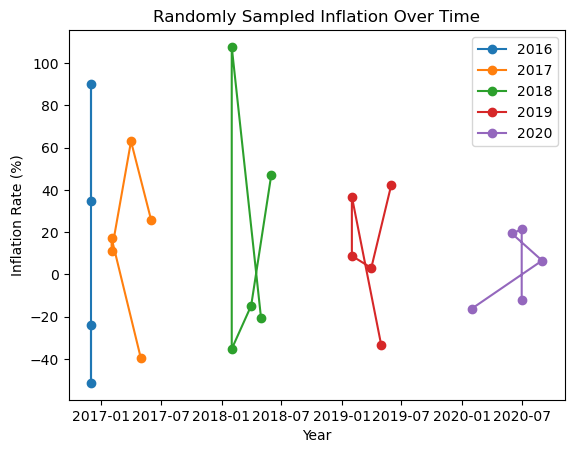

In [49]:
# Convert the 'Date' column to a datetime object
east_midlands_data['Date'] = pd.to_datetime(east_midlands_data['Date'])

# Create a figure and axis (subplot)
fig, ax = plt.subplots()

# Group the data by year and sample 10 random data points for each year
sampled_data = east_midlands_data.groupby(east_midlands_data['Date'].dt.year).apply(lambda x: x.sample(5, random_state=1))

# Create the inflation graph
for year, group in sampled_data.groupby(sampled_data['Date'].dt.year):
    ax.plot(group['Date'], group['Inflation'], marker='o', linestyle='-', label=str(year))

# Add labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Inflation Rate (%)')
ax.set_title('Randomly Sampled Inflation Over Time')

# Add a legend to differentiate the years
ax.legend()

# Display the graph
plt.show()

In [ ]:
west_midlands_pattern = r'(Birmingham|Coventry|Dudley|Sandwell|Solihull|Walsall|Wolverhampton)'

# Use str.contains with the pattern to filter the DataFrame
west_midlands_data = e_area_code[e_area_code['Region_Name'].str.contains(west_midlands_pattern, case=False, regex=True)]

In [ ]:
#Sort the date of the data in accending order
west_midlands_data.sort_values(by='Date', inplace=True)
# Calculate the inflation rate using percentage change
west_midlands_data['Inflation'] = west_midlands_data['Average_Price'].pct_change() * 100
#print(east_midlands_data)

C:\Users\Emmanuel\AppData\Local\Temp\ipykernel_12392\3537501340.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  west_midlands_data['Date'] = pd.to_datetime(west_midlands_data['Date'])


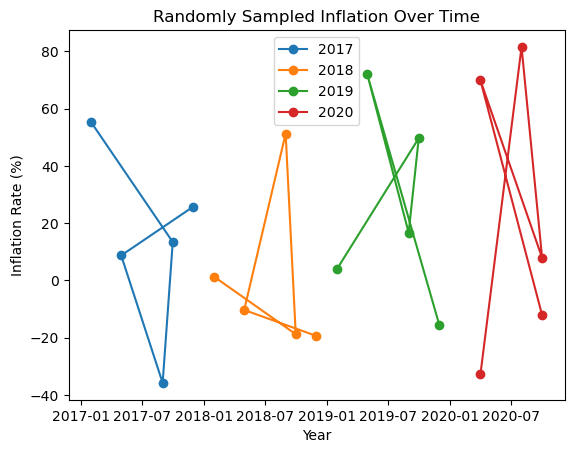

In [54]:
# Convert the 'Date' column to a datetime object
west_midlands_data['Date'] = pd.to_datetime(west_midlands_data['Date'])

# Create a figure and axis (subplot)
fig, ax = plt.subplots()

# Group the data by year and sample 10 random data points for each year
sampled_data = west_midlands_data.groupby(west_midlands_data['Date'].dt.year).apply(lambda x: x.sample(5, random_state=1))

# Create the inflation graph
for year, group in sampled_data.groupby(sampled_data['Date'].dt.year):
    ax.plot(group['Date'], group['Inflation'], marker='o', linestyle='-', label=str(year))

# Add labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Inflation Rate (%)')
ax.set_title('Randomly Sampled Inflation Over Time')

# Add a legend to differentiate the years
ax.legend()

# Display the graph
plt.show()

C:\Users\Emmanuel\AppData\Local\Temp\ipykernel_12392\703524902.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  east_midlands_data['Date'] = pd.to_datetime(east_midlands_data['Date'])


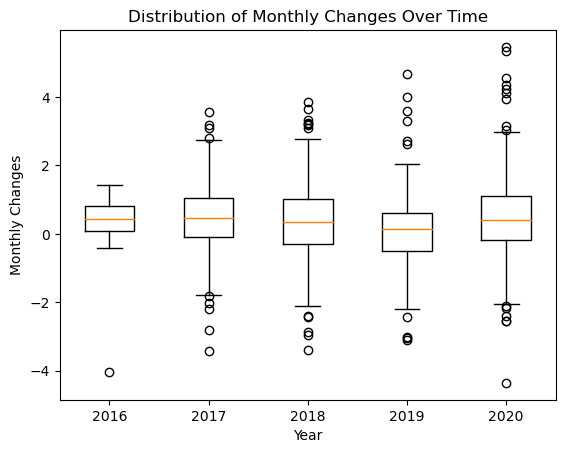

In [71]:

# Convert the 'Date' column to a datetime object
east_midlands_data['Date'] = pd.to_datetime(east_midlands_data['Date'])

# Create a figure and axis (subplot)
fig, ax = plt.subplots()

# Group the data by year and collect monthly changes for each year
grouped_data = [group['Monthly_Change'].values for year, group in data.groupby(east_midlands_data['Date'].dt.year)]

# Create a box plot
ax.boxplot(grouped_data)

# Set labels for the x-axis
ax.set_xticklabels([str(year) for year, _ in east_midlands_data.groupby(east_midlands_data['Date'].dt.year)])

# Add labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Monthly Changes')
ax.set_title('Distribution of Monthly Changes Over Time')

# Display the graph
plt.show()

Box plot 
anotherreval